## Instituto Superior de Engenharia de Lisboa 
## LEIM - 2024/2025
### PIV - Processamento de Imagem e Visão

# <br>

#### <center> Trabalho Prático 1 </center>
<b> <center> Grupo 14 </center> </b> 
# <br>



Trabalho realizado por:

* João Fonseca nº<b> 49707 </b>
* Diogo Coito nº<b> 50029 </b>

 Docente: Pedro Mendes Jorge 
# <br>

# Introdução

Este trabalho prático tem como objetivo proporcionar aos estudantes uma experiência prática no processo de classificação de objetos em imagens, utilizando a biblioteca OpenCV, que é amplamente aplicada nesta área.

O trabalho proposto consiste em desenvolver um algoritmo que identifique e conte quantas peças de lego de cada tipo estão dispostas sobre uma mesa, a partir de imagens fornecidas ao sistema.

In [41]:
import cv2
import numpy as np

import matplotlib.pyplot as plt
import os

# grupo 14

## 1. Leitura de imagens 
 
 Os paths das imagens de treino que vamos necessitar durante o TP são guardados num array 



In [43]:
path = 'treino'
f = ['lego01.jpg', 'lego02.jpg', 'lego04.jpg', 'lego09.jpg', 'lego10.jpg', 'lego11.jpg', 'lego12.jpg', 'lego13.jpg', 'lego21.jpg', 'lego22.jpg', 'lego23.jpg', 'lego25.jpg', 'lego30.jpg', 'lego32.jpg']

files = [os.path.join(path,fls) for fls in f]
print(files)

['treino\\lego01.jpg', 'treino\\lego02.jpg', 'treino\\lego04.jpg', 'treino\\lego09.jpg', 'treino\\lego10.jpg', 'treino\\lego11.jpg', 'treino\\lego12.jpg', 'treino\\lego13.jpg', 'treino\\lego21.jpg', 'treino\\lego22.jpg', 'treino\\lego23.jpg', 'treino\\lego25.jpg', 'treino\\lego30.jpg', 'treino\\lego32.jpg']


## Algoritmo

Começámos por desenvolver a função verHistogramas(), que tem como objetivo calcular e visualizar os histogramas dos diferentes canais de cor de uma imagem. Inicialmente, a imagem é lida e convertida numa versão em escala de cinzento, enquanto os canais BGR (Azul, Verde e Vermelho) são extraídos. Em seguida, são calculados os histogramas para cada canal, incluindo a versão a cinzento, utilizando a função cv2.calcHist() da biblioteca OpenCV. Os histogramas são apresentados graficamente num layout de subplots, onde cada um mostra a distribuição de intensidade dos pixels de cada canal de cor, facilitando a análise visual 






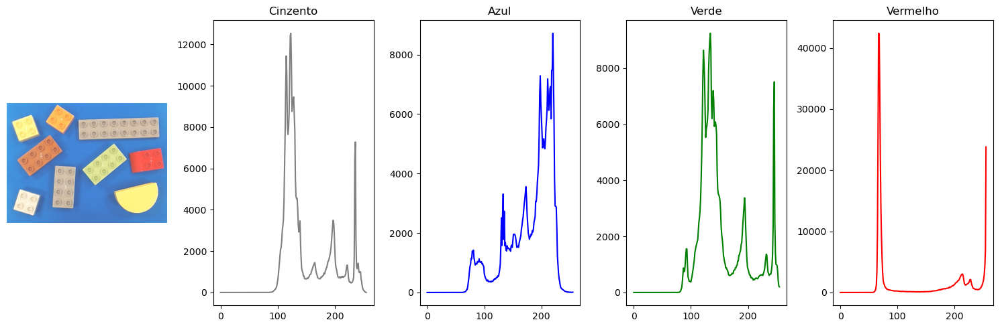

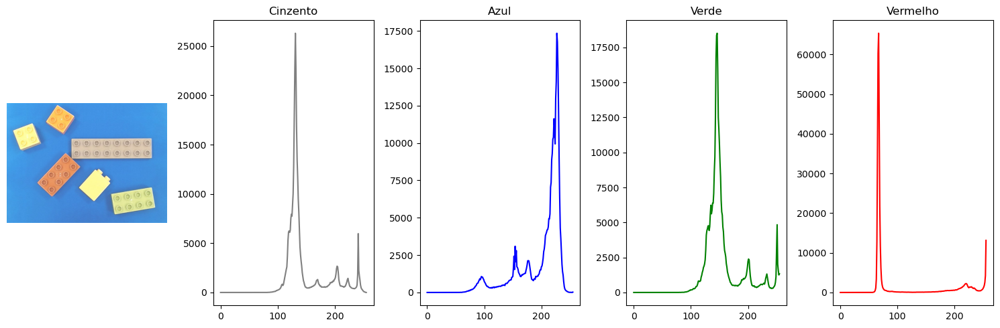

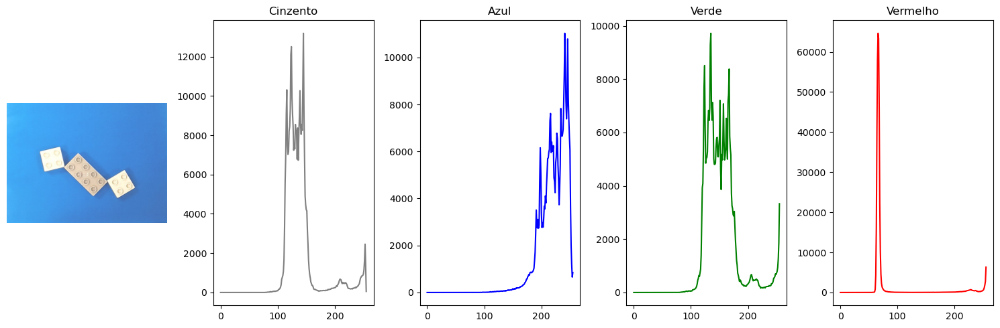

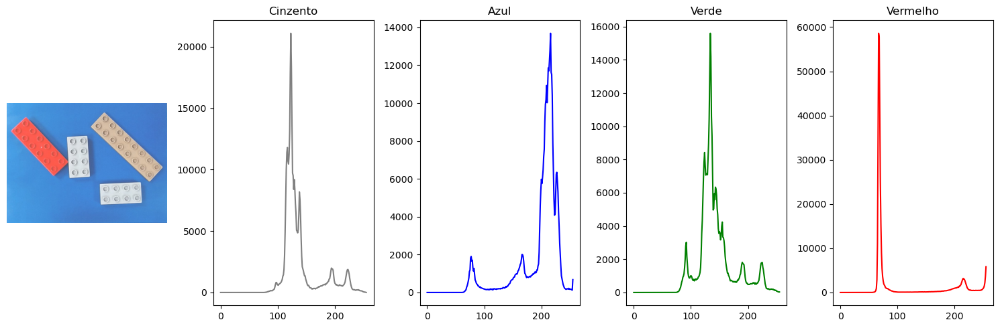

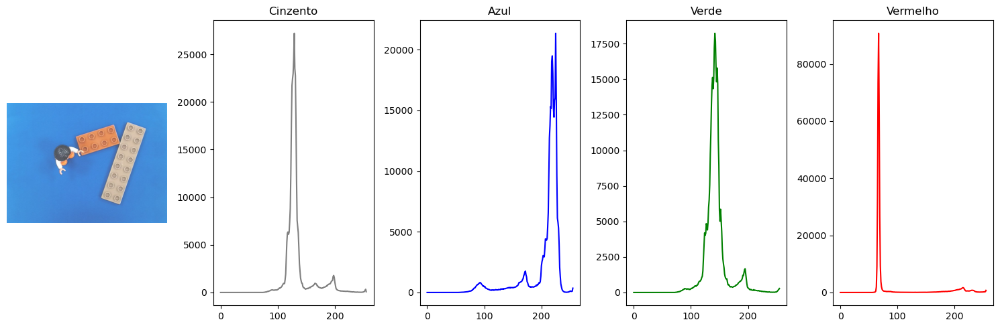

...

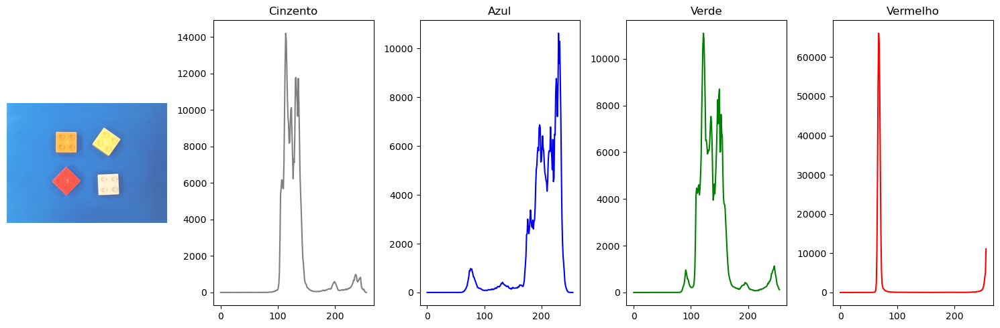

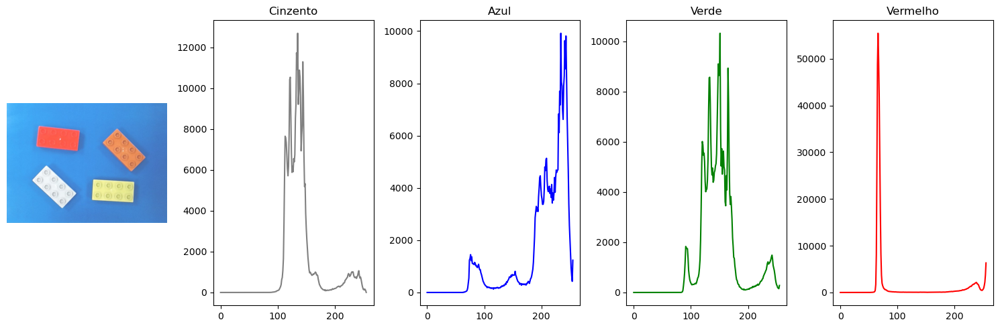

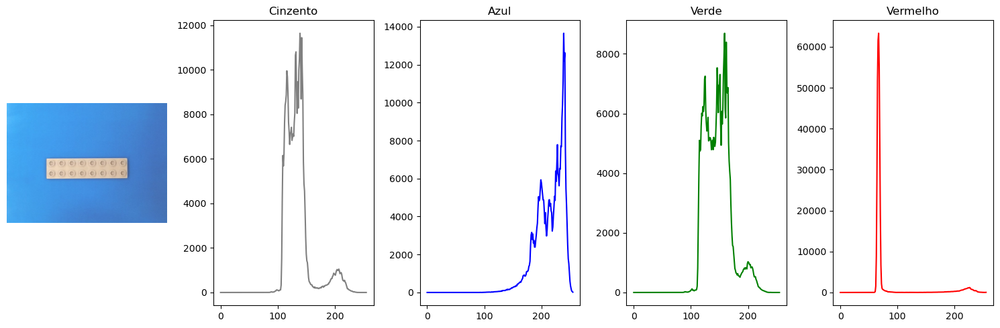

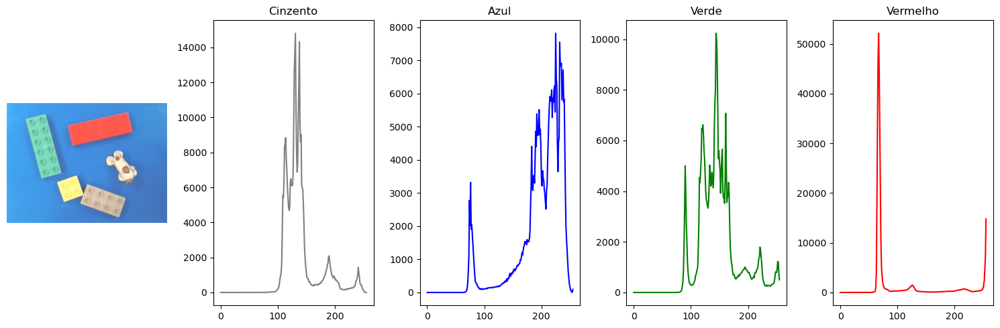

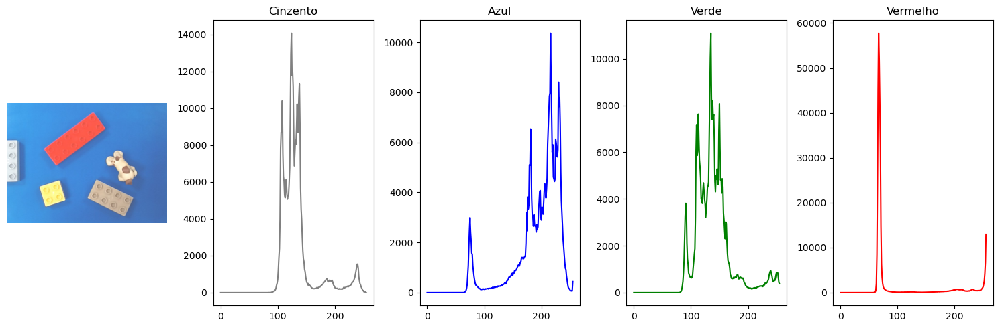

In [45]:
def verHistogramas(image_file):
    # Ler a imagem
    img = cv2.imread(image_file)
    
    # Extração dos canais de cor e da imagem cinzenta
    imgGray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    imgBlue, imgGreen, imgRed = cv2.split(img)  # Dividir em canais BGR
    
    
    histSize = 256
    histRange = (0, 256)
    
    # Calcular os histogramas
    histograms = {
        "Cinzento": cv2.calcHist([imgGray], [0], None, [histSize], histRange),
        "Azul": cv2.calcHist([imgBlue], [0], None, [histSize], histRange),
        "Verde": cv2.calcHist([imgGreen], [0], None, [histSize], histRange),
        "Vermelho": cv2.calcHist([imgRed], [0], None, [histSize], histRange)
    }
    
    
    fig, axes = plt.subplots(1, 5, figsize=(15, 5))  
    canaisCor = {"Cinzento": 'gray', "Azul": 'blue', "Verde": 'green', "Vermelho": 'red'}
    
   
    axes[0].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))  # Converter de BGR para RGB
    axes[0].axis('off')
    
    
   
    for ax, (channel, hist) in zip(axes[1:], histograms.items()):
        ax.plot(np.arange(histSize), hist, color=canaisCor[channel])
        ax.set_title(channel)
    
    plt.tight_layout()

for file in files:
    verHistogramas(file)

### 2. Binarização 

O próximo passo é binarizar a imagem. Para isso, utilizamos a função *threshold* da biblioteca cv2. Basta fornecer a imagem lida, o valor do threshold desejado, o valor máximo que um pixel pode assumir e a técnica de threshold que queremos aplicar. O resultado é uma imagem binarizada que facilita a extração de características relevantes para análises posteriores.

Definimos vários valores de threshold (105, 127, 150 e 180) para o threshold fixo, aplicando-os ao canal vermelho da imagem para observar o efeito da binarização. Também aplicámos o método de Otsu ao canal vermelho, tendo em conta que este define um limiar automático sem precisar que um valor lhe seja fornecido. As imagens resultantes são apresentadas numa grelha para comparação visual, facilitando a identificação do threshold que melhor separa os objetos do fundo. A partir dessa compração visual, chegámos à conclusão que a melhor opção é utilizar o valor fixo 105 como trehsold.

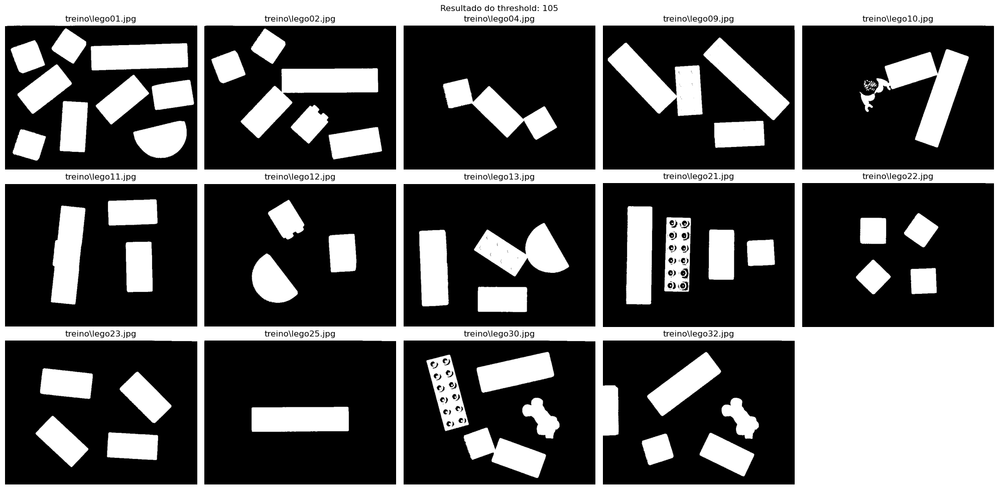

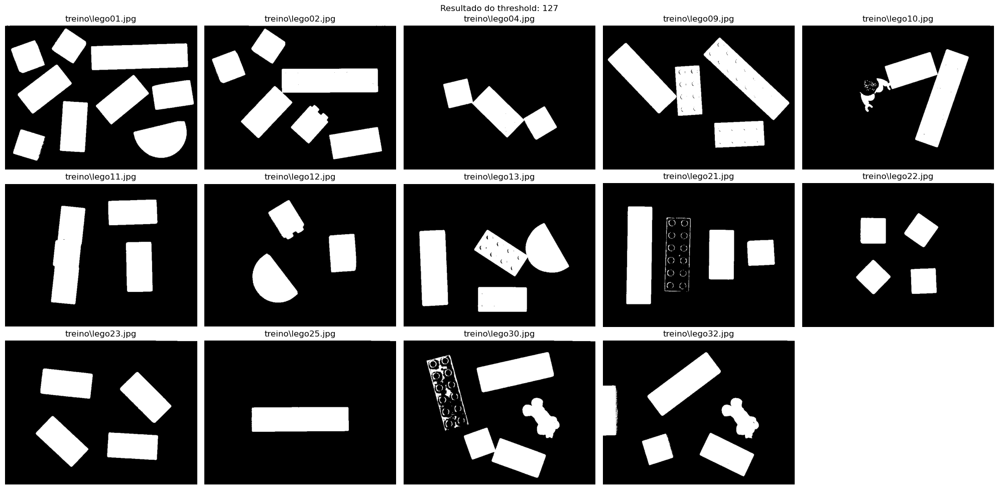

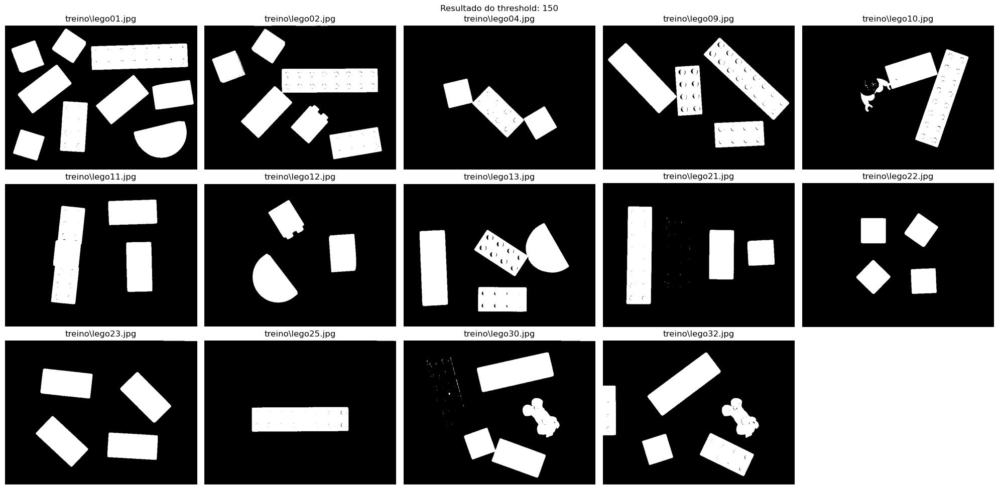

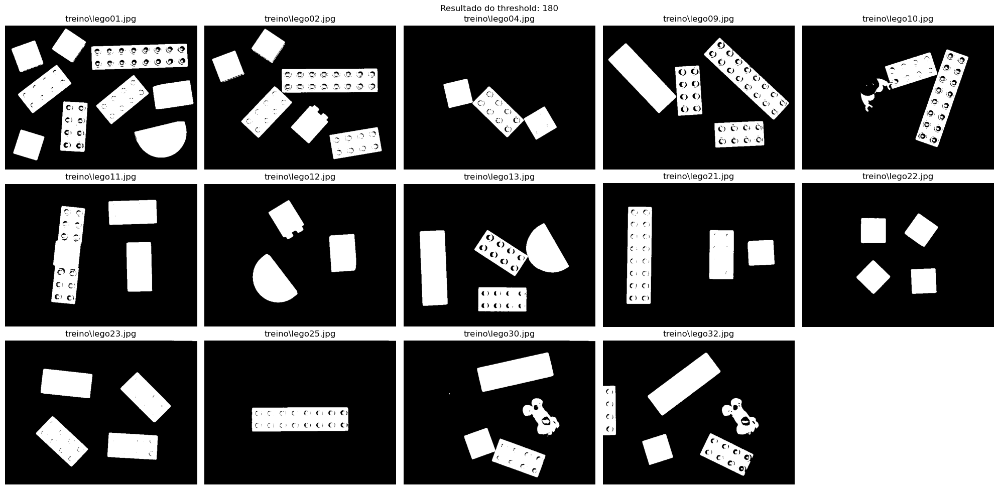

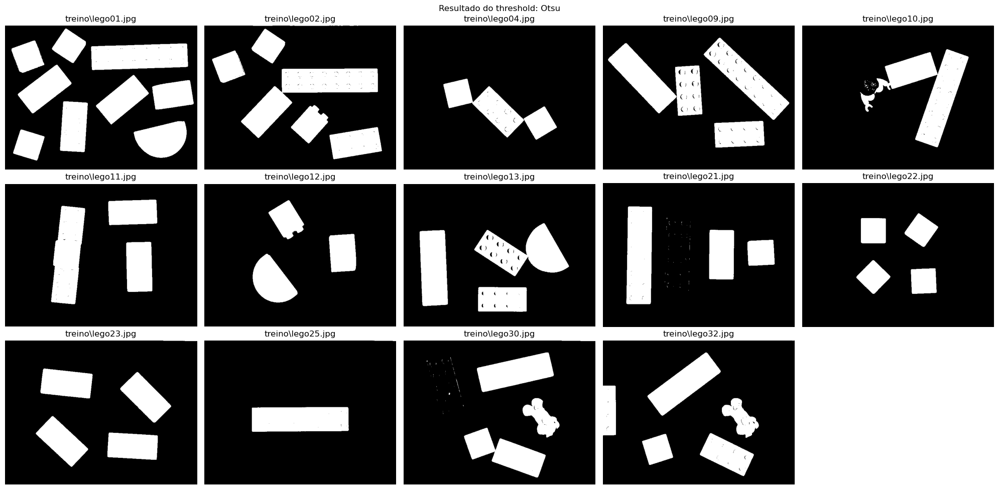

In [46]:
def binarizeImage(img, threshold):
    if threshold == 'Otsu':
        _, binImg = cv2.threshold(img, 0, 255, cv2.THRESH_OTSU)
    else:
        _, binImg = cv2.threshold(img, threshold, 255, cv2.THRESH_BINARY)
    return binImg

# conjunto de tresholds que vão ser utilizados
thresholds = [105, 127, 150, 180, 'Otsu']


for threshold in thresholds:
    fig, axes = plt.subplots(3, 5, figsize=(20, 10))
    axes = axes.flatten()

    for i,fileName in enumerate(files):
        img = cv2.imread(fileName)
        
        redChannelImage = img[:,:,2]
        
        binaryImage = binarizeImage(redChannelImage, threshold)
        
        axes[i].imshow(binaryImage, cmap='gray')
        axes[i].set_title(fileName)
        axes[i].axis('off')
    
    for ax in axes[len(files):]:
        ax.axis('off')

    fig.suptitle(f'Resultado do threshold: {threshold}')
    plt.tight_layout()

## 3. Melhoramento da imagem 

 Nesta parte do trabalho, o objetivo era remover alguns pixeis da imagem binária de maneira a isolar melhor cada objeto da imagem. Este melhoramento é conseguido através de operadores morfológicos. Até ao momento, abordámos quatro tipos de operadores: a dilatação, a erosão, a abertura e o fecho. Para este caso, utilizámos a erosão e a dilatação, por haver contacto entre peças e haver a necessidade de as isolar.

 Inicialmente, o fecho é aplicado para preencher pequenas falhas e juntar partes fragmentadas dos objetos, utilizando um elemento estruturante retangular com os tamanhos especificados. Em seguida, aplica-se a erosão, utilizando um elemento estruturante em forma de elipse, com o intuito de remover pequenas vestígios e ajustar os contornos, facilitando assim a extração de características dos legos. Optámos pelo uso da forma da elipse na erosão, após termos feito alguns testes tanto com o formato retangular como com a elipse e esta ter produzido um melhor resultado.


Foram testados vários tamanhos de elementos estruturantes para o fecho e a erosão, de modo a determinar as melhores combinações para as imagens mais críticas (nomeadamente lego02.jpg, lego04.jpg, lego09.jpg e lego10.jpg). A cada combinação, o algoritmo processa estas imagens e apresenta o resultado em subplots, permitindo uma análise visual do impacto dos parâmetros nas transformações morfológicas. Os resultados obtidos ajudam a identificar os parâmetros ideais para otimizar a qualidade do processamento e segmentação dos legos.

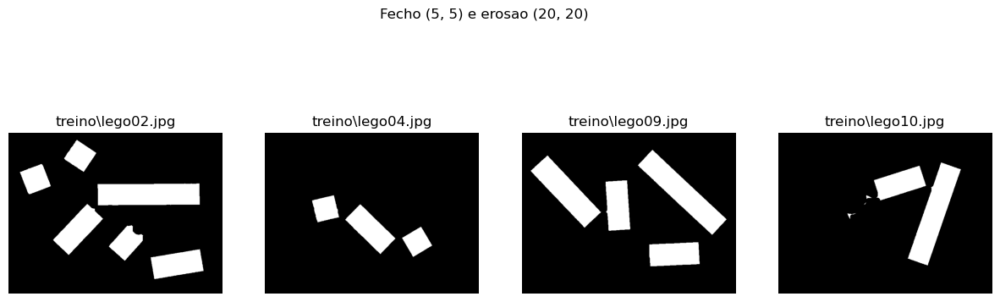

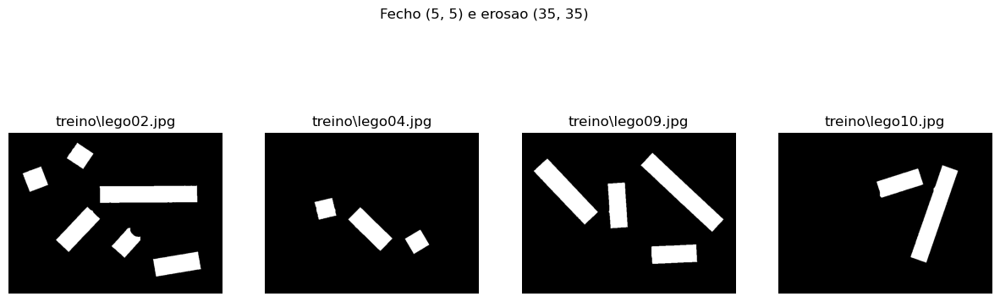

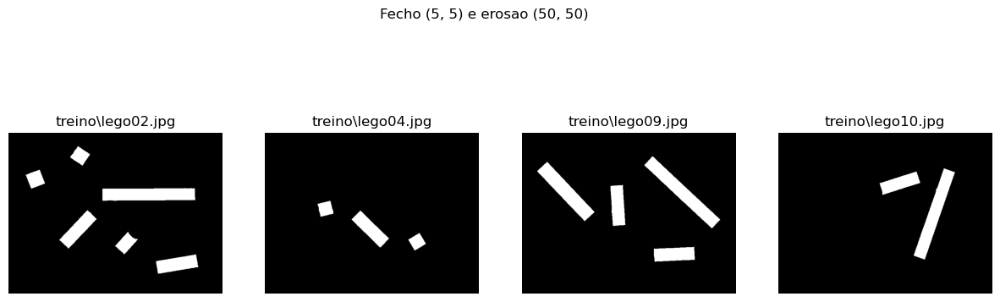

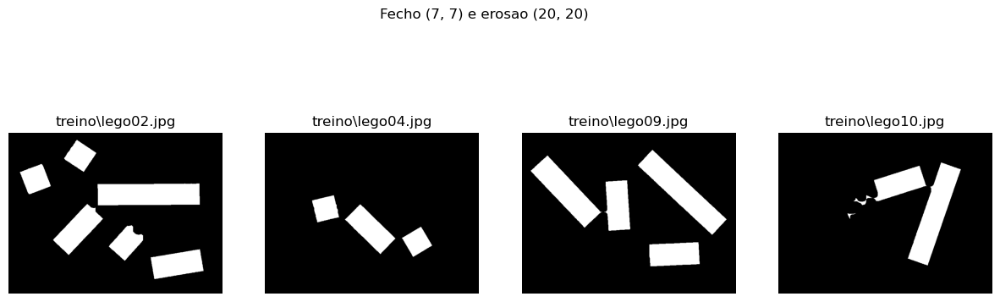

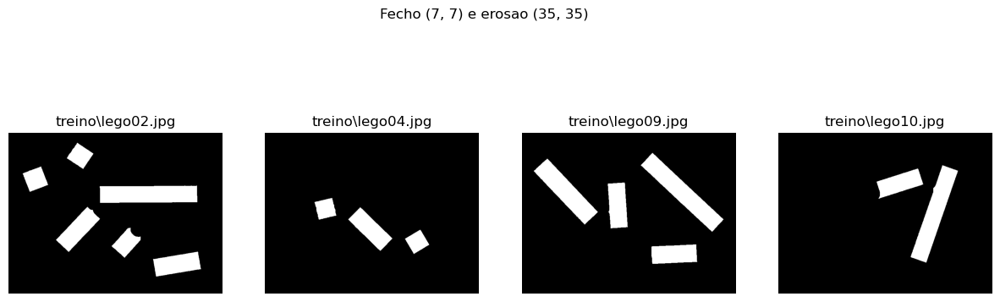

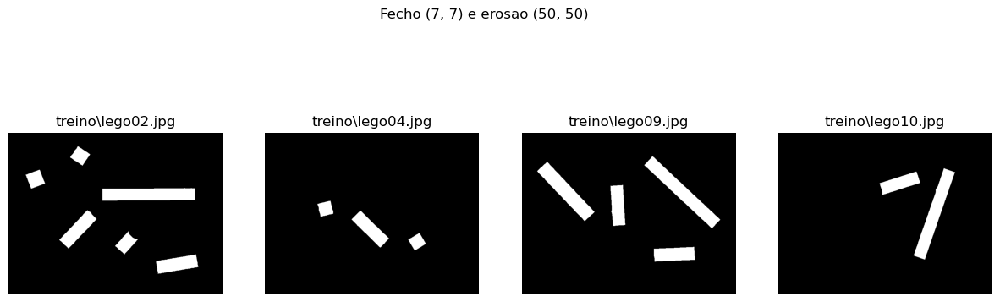

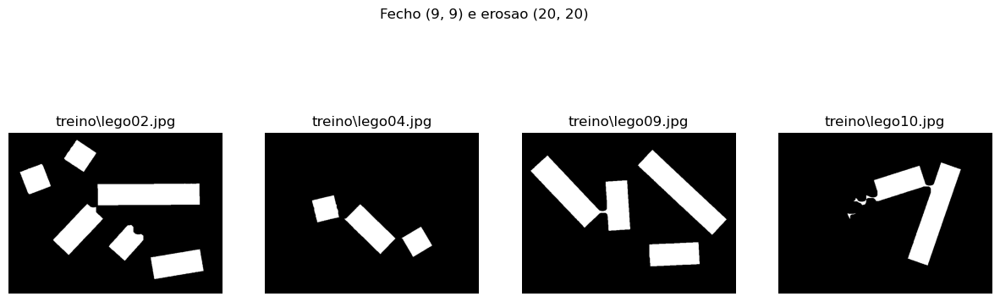

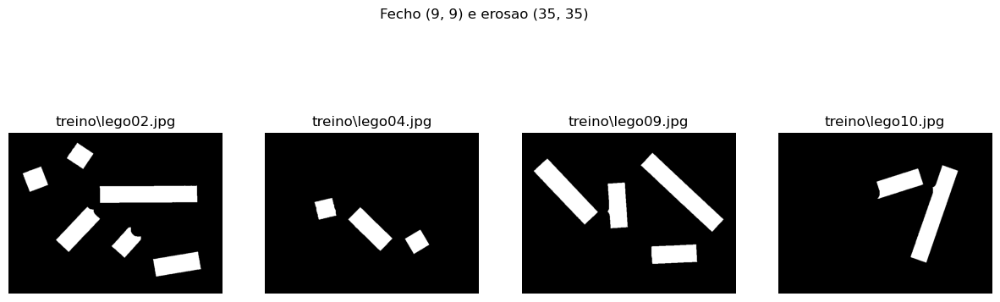

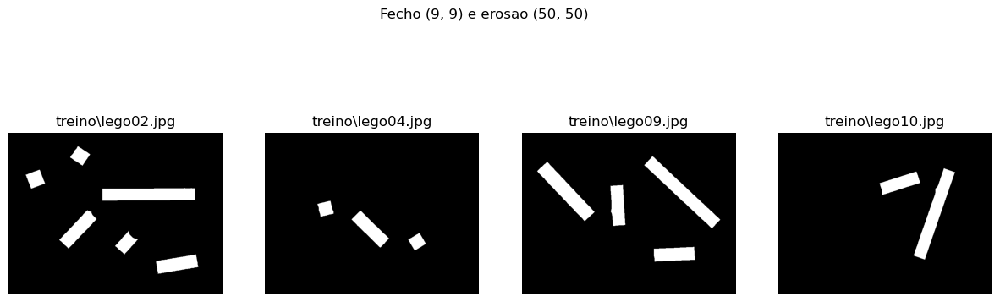

In [137]:
def improveImg(image, closeSize, erodeSize):

    newImg = cv2.morphologyEx(image, cv2.MORPH_CLOSE, cv2.getStructuringElement(cv2.MORPH_RECT, closeSize))
    newImg = cv2.morphologyEx(newImg, cv2.MORPH_ERODE, cv2.getStructuringElement(cv2.MORPH_ELLIPSE, erodeSize))

    return newImg

# testar para varios valores
valoresFecho = [(5, 5), (7,7), (9, 9)]
valoresErosao = [(20, 20), (35, 35), (50, 50)]

inNeedImg = [f"{path}\\lego02.jpg", f"{path}\\lego04.jpg", f"{path}\\lego09.jpg", f"{path}\\lego10.jpg"]
for closeElementSize in valoresFecho:
    for erodeElementSize in valoresErosao:

        f = plt.figure(figsize=(15,5))
        f1 = f.add_subplot(1, 4, 1)
        f2 = f.add_subplot(1, 4, 2)
        f3 = f.add_subplot(1, 4, 3)
        f4 = f.add_subplot(1, 4, 4)
        

        subplots = [f1, f2, f3, f4]

        for i in range(len(inNeedImg)):

            img = cv2.imread(inNeedImg[i])

            imgRed = img[:,:,2]
            binaryImage = binarizeImage(imgRed,105)
            processedImage =improveImg(binaryImage, closeElementSize, erodeElementSize)
            

            subplots[i].imshow(processedImage, cmap='gray')
            subplots[i].axis("off")
            subplots[i].set_title(inNeedImg[i])

        f.suptitle(f'Fecho {closeElementSize} e erosao {erodeElementSize}')

## 4. Extracção de componentes conexos

O objetivo desta parte é identificar e extrair os contornos dos legos, através da aplicação de técnicas de processamento de imagem.

Cada imagem do conjunto de treino é primeiramente processada através de binarização, aplicando um threshold de valor 105 ao canal vermelho. Em seguida, o algoritmo melhora a imagem utilizando os operadores morfológicas definidas anteriormente e faz extração dos contornos. Estes são desenhados sobre a imagem original, utilizando a função cv2.drawContours(), que desenha os contornos a vermelho para facilitar a visualização.

O objetivo desta é verificar a eficácia do algoritmo em identificar corretamente os contornos dos legos, validando assim o desempenho da segmentação e a aplicação das transformações morfológicas no contexto do trabalho.


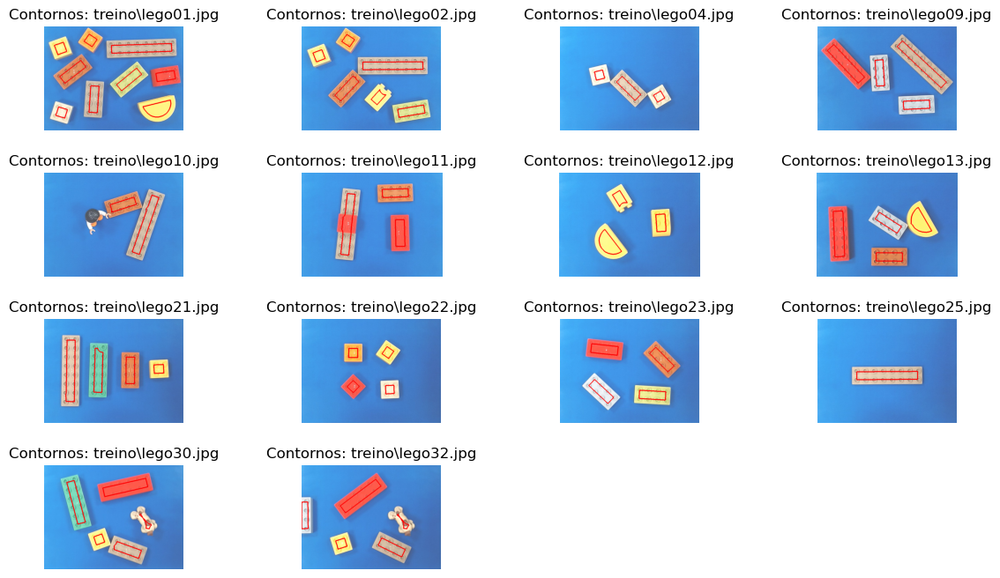

In [135]:
#Extração de componentes

#Função para retornar os contornos
def get_image_components(image):
    contours, hierarchy = cv2.findContours(image, cv2.RETR_CCOMP, cv2.CHAIN_APPROX_SIMPLE)
    return contours, hierarchy[0,:,:]


f = plt.figure(figsize=(14, 8))
subplots = [f.add_subplot(4, 4, i) for i in range(1, 15)]  


for i, file_name in enumerate(files):
    img = cv2.imread(file_name)
    
    img_red = img[:,:,2]  
    binary_image = binarizeImage(img_red, 105)  
    processed_image = improveImg(binary_image, (9, 9), (50, 50)) 
    
    contornos, _ = get_image_components(processed_image)

    test_image = img.copy()
    cv2.drawContours(test_image, contornos, -1, (0, 0, 255), 4)  

    plt.subplots_adjust(wspace=0.4, hspace=0.4)
    
    subplots[i].imshow(cv2.cvtColor(test_image, cv2.COLOR_BGR2RGB))  
    subplots[i].set_title(f'Contornos: {file_name}') 
    subplots[i].axis("off")


## 5. Extracção de propriedades

Esta parte consiste na extração do comprimento e da largura dos contornos. A partir destes valores, podemos avaliar e identificar padrões que nos vão permitir identificar cada peça de lego presente na imagem. Os valores do comprimentos e da largura são colocados sob a peça de lego respetiva a estes,
sendo esta última essencial para validar o processo de segmentação dos legos e para compreender as suas dimensões. Posteriormente, decidimos calcular a área de cada peça para ter mais uma maneira de avaliar cada peça.

A visualização dos contornos e das anotações ajuda a garantir que o algoritmo está a funcionar corretamente e a identificar quaisquer problemas que possam surgir na segmentação ou no cálculo das medidas.

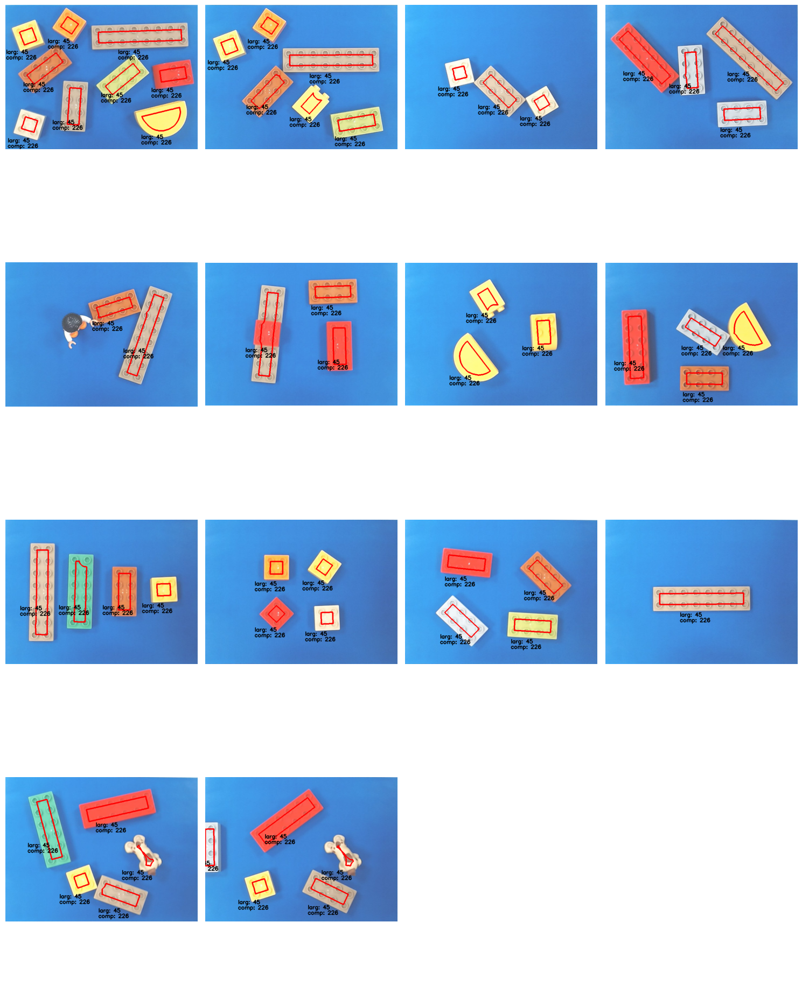

In [147]:
num_images = len(files)
num_cols = 4
num_rows = 4

fig, ax = plt.subplots(num_rows, num_cols, figsize=(15, 5 * num_rows))  
ax = ax.flatten()
arrayCont = []

for i in range(len(files)):

    fileName = files[i]
    
    img = cv2.imread(fileName)
   
    imgRed = img[:,:,2]
    binaryImage = binarizeImage(imgRed,105)
    processedImage = improveImg(binaryImage,(9,9),(50,50))
    
    componentsContours, componentsHierarchys = get_image_components(processedImage)

    testImage = img.copy()  
    contoursImg = cv2.drawContours(testImage, componentsContours, -1, (0, 0, 255), 4) 
    arrayCont.append(componentsContours)

    for c in componentsContours:
        (centroX,centroY),(width,height),ang = cv2.minAreaRect(c)
        x = int(centroX)
        y = int(centroY)

        largura = min(int(round(width, 0)),int(round(height, 0)))
        comprimento = max(int(round(width, 0)),int(round(height, 0)))

        drawnImg = cv2.putText(contoursImg, f"larg: {largura}", (x-80, y+65), fontFace=cv2.FONT_HERSHEY_SIMPLEX, fontScale=0.65, color=(0, 0, 0),thickness=2)
        drawnImg = cv2.putText(contoursImg, f"comp: {comprimento}", (x-80, y+85), fontFace=cv2.FONT_HERSHEY_SIMPLEX, fontScale=0.65, color=(0, 0, 0),thickness=2)

    ax[i].imshow(cv2.cvtColor(drawnImg, cv2.COLOR_BGR2RGB))
    ax[i].axis('off')
    
for j in range(num_images, num_rows * num_cols):
    ax[j].axis('off')
    

plt.tight_layout() 

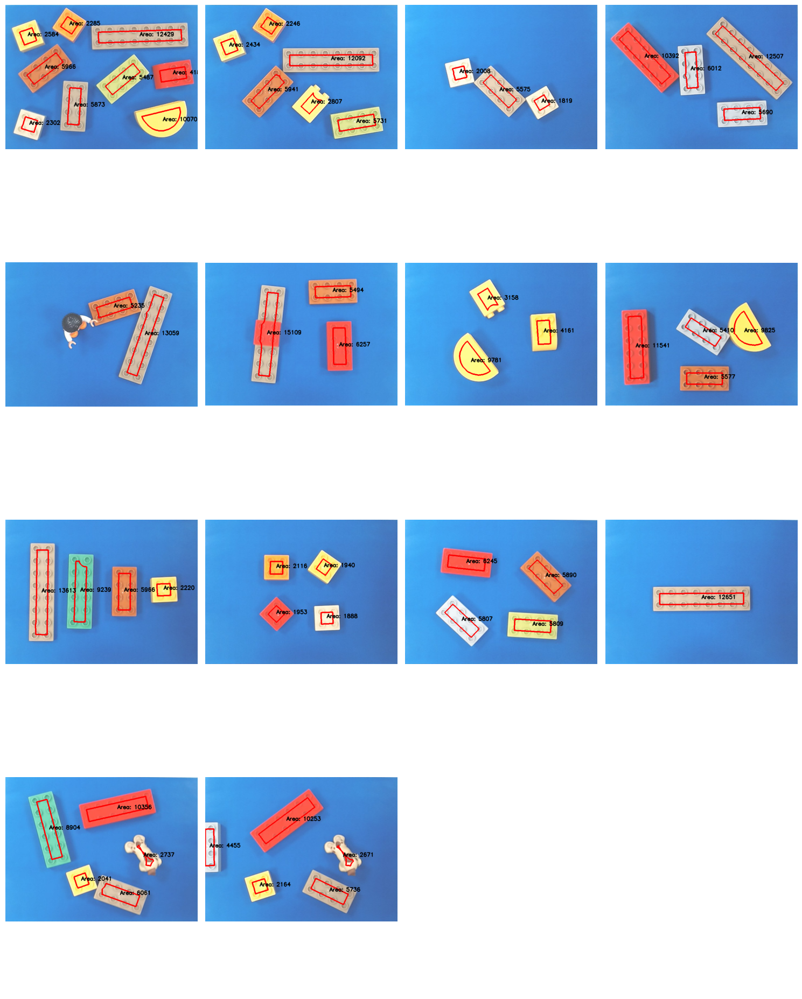

In [129]:
def calcular_area(width, height):
    return int(round(width * height))

num_images = len(files)

fig, ax = plt.subplots(4, 4, figsize=(15, 5 * 4))
ax = ax.flatten()  

contours_array = []

for i, file_name in enumerate(files):
    img = cv2.imread(file_name)

    img_red = img[:,:,2]
    binary_image = binarizeImage(img_red, 105)
    processed_image = improveImg(binary_image, (9, 9), (50, 50))

    components_contours, _ = get_image_components(processed_image)

    contours_img = img.copy()
    contours_array.append(components_contours)

    for contour in components_contours:
        (centroX, centroY), (width, height), angle = cv2.minAreaRect(contour)
        x, y = int(centroX), int(centroY)

        cv2.drawContours(contours_img, [contour], -1, (0, 0, 255), 4)

        area_text = f"Area: {calcular_area(width, height)}"
        contours_img = cv2.putText(contours_img, area_text, (x, y), fontFace=cv2.FONT_HERSHEY_SIMPLEX, fontScale=0.65,color=(0, 0, 0), thickness=2)

    
    ax[i].imshow(cv2.cvtColor(contours_img, cv2.COLOR_BGR2RGB))
    ax[i].axis('off')


for j in range(num_images, 4 * 4):
    ax[j].axis('off')

plt.tight_layout()

## 6. Classificação de objetos

Por último, para fazer a classficação de cada uma das peças, utilizámos um classificador em árvore para determinar de que peça se tratava. As condições para avaliar a peça foram elaboradas com base na observação dos dados obtidos no ponto anterior e foram as seguintes:
- Peças 2x2: Tem uma altura e uma largura entre 40 e 60
- Peças 2x4: Tem uma área entre 5000 e 7000
- Peças 2x6: Tem uma área entre 6500 e 11900 e a sua largura é quatro vezes inferior à altura
- Peças 2x8: Tem um área entre 12000 e 15500
- Outras peças: Não satisfaz nenhuma das condições anteriores

O número de peças de cada tipo é depois adicionado ao canto superior da imagem e assim fica completo o algoritmo

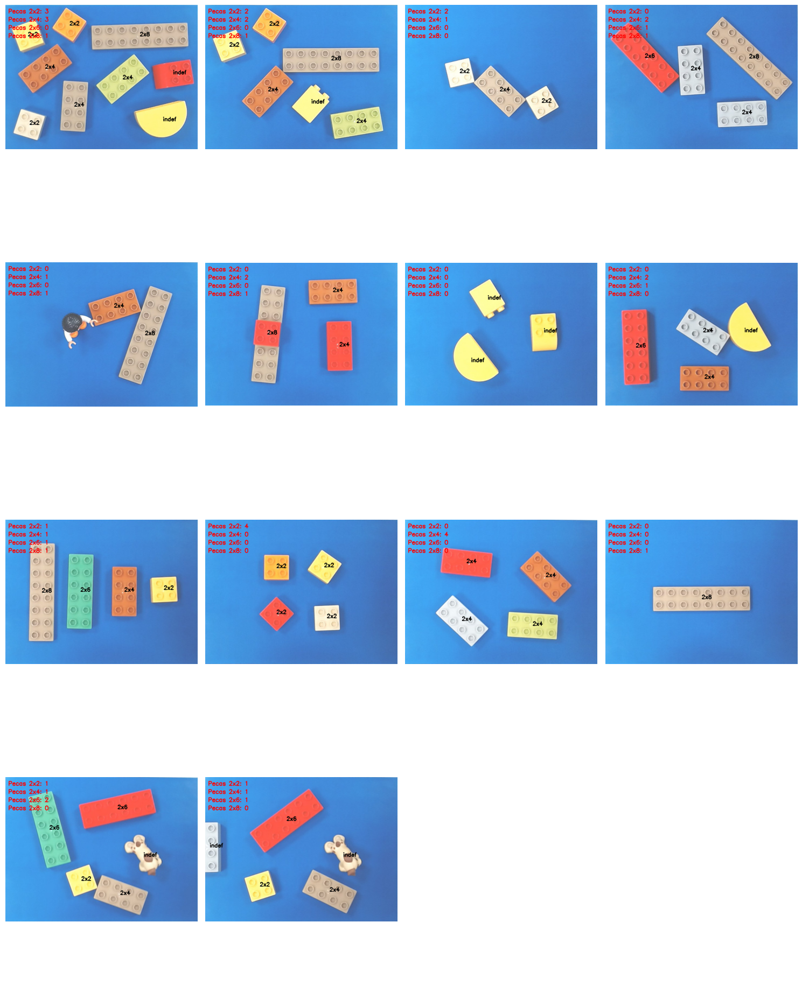

In [149]:


def classificar_pecas(width, height):
    area_object = calcular_area(width, height)

    if 40 <= width <= 60 and 40 <= height <= 60:
        return "2x2"
    elif 5000 <= area_object <= 7000:
        return "2x4"
    elif 6500 <= area_object <= 11900 and (width * 4 < height or height * 4 < width):
        return "2x6"
    elif 12000 <= area_object <= 15500:
        return "2x8"
    else:
        return "indef"


def contarPecas(classifications):
    piece_counts = {
        "2x2": 0,
        "2x4": 0,
        "2x6": 0,
        "2x8": 0
    }

    for cls in classifications:
        if cls in piece_counts:
            piece_counts[cls] += 1

    return piece_counts


def desenhaPecas(image, piece_counts):
    y_offset = 30  
    x_offset = 10  

    for piece, count in piece_counts.items():
        text = f"Pecas {piece}: {count}"
        cv2.putText(image, text, (x_offset, y_offset), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 0, 255), 2)
        y_offset += 30  

    return image

num_images = len(files)

fig, ax = plt.subplots(4, 4, figsize=(15, 5 * 4))
ax = ax.flatten()


all_classifications = []

for i in range(num_images):
    file_name = files[i]
    img = cv2.imread(file_name)

    img_red = img[:,:,2]
    binary_image = binarizeImage(img_red, 105)
    processed_image = improveImg(binary_image, (9, 9), (50, 50))

    components_contours, _ = get_image_components(processed_image)

    test_image = img.copy()
    classifications = []  

    for contour in components_contours:
        (centroX, centroY), (width, height), _ = cv2.minAreaRect(contour)
        x, y = int(centroX), int(centroY)

        lego_type = classificar_pecas(width, height)  
        classifications.append(lego_type)

        cv2.putText(test_image, lego_type, (x, y), cv2.FONT_HERSHEY_SIMPLEX, 0.65, (0, 0, 0), 2)

    piece_counts = contarPecas(classifications)

    test_image = desenhaPecas(test_image, piece_counts)

    all_classifications.append(classifications)

    ax[i].imshow(cv2.cvtColor(test_image, cv2.COLOR_BGR2RGB))
    ax[i].axis('off')

for j in range(num_images, 4 * 4):
    ax[j].axis('off')

plt.tight_layout()

## Conclusão

O trabalho desenvolvido permitiu explorar diversas técnicas de processamento de imagem e segmentação aplicadas à identificação e classificação de peças lego. A utilização da biblioteca OpenCV revelou-se crucial para a manipulação de imagens, através de operações como binarização, aplicação de transformações morfológicas e extração de contornos, permitindo uma segmentação eficaz dos objetos nas imagens.

A implementação de um sistema de classificação e contagem automática das peças lego, baseada nas suas áreas e dimensões, demonstrou ser uma abordagem eficiente para resolver o problema proposto. Embora o algoritmo funcione bem em condições controladas, a precisão pode ser afetada por fatores como iluminação, sobreposição de peças (que foi o caso) e diferentes ângulos de aquisição das imagens, sendo este um aspeto importante para futuras melhorias.

Os resultados obtidos evidenciam a capacidade do modelo para identificar e contar diferentes tipos de peças lego de forma precisa, desde que as condições de imagem sejam semelhantes às utilizadas durante o treino e testes. 

Em suma, o trabalho alcançou os seus objetivos principais, proporcionando uma compreensão mais profunda sobre o processamento e análise de imagens, bem como sobre as potencialidades e limitações do python e das respetivas bibliotecas utilizadas neste trabalho.